# Trial on Block Matching (using Github repo)

Shapes: (288, 384) (288, 384)


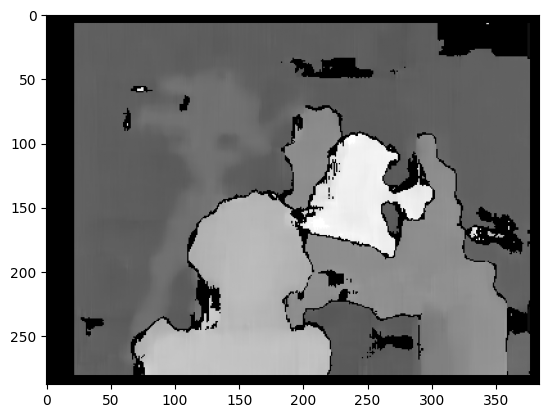

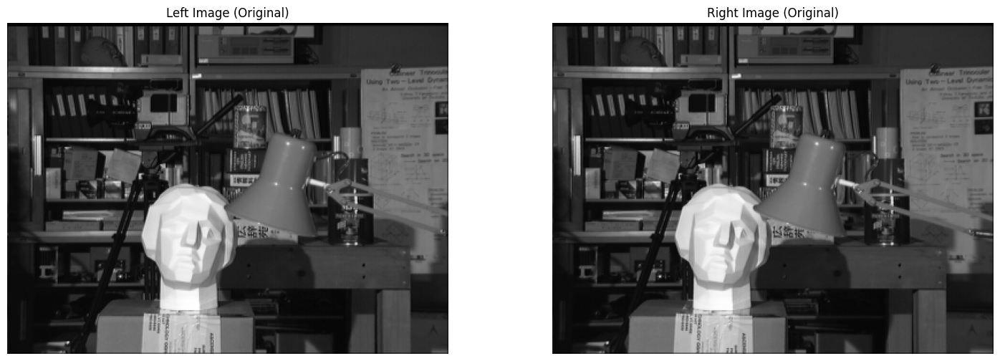

In [1]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt

# Load images
imgL = cv.imread('DisparityMapfromStereoPair-master/tsukuba_l.png', cv.IMREAD_GRAYSCALE)
imgR = cv.imread('DisparityMapfromStereoPair-master/tsukuba_r.png', cv.IMREAD_GRAYSCALE)

# Check loading
if imgL is None or imgR is None:
    raise ValueError("One or both images not loaded. Check file paths!")

# Check shape
print("Shapes:", imgL.shape, imgR.shape)
if imgL.shape != imgR.shape:
    imgR = cv.resize(imgR, (imgL.shape[1], imgL.shape[0]))

# Stereo BM
stereo = cv.StereoBM.create(numDisparities=16, blockSize=15)
# numDisparities : Must be > 0 and multiple of 16 (OpenCV requirement).
# blockSize : Must be odd, between 5 and 255, and not larger than image width/height.
disparity = stereo.compute(imgL, imgR)
# result is typically CV_16S (signed 16-bit) and disparities are scaled by 16 (i.e. fixed-point with 4 fractional bits).
# So the real disparity in pixels = disparity.astype(np.float32) / 16.0.

# Normalize for display
disp_vis = cv.normalize(disparity, None, 0, 255, cv.NORM_MINMAX, cv.CV_8U)

plt.imshow(disp_vis, cmap='gray')
plt.show()


plt.figure(figsize=(18,6))
plt.subplot(1,2,1)
plt.imshow(imgL, cmap='gray')
plt.title("Left Image (Original)")
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(imgR, cmap='gray')
plt.title("Right Image (Original)")
plt.axis('off')

plt.show()

In [2]:
# # Block matching Object Modification 

# window_size = 5
# min_disp = 0
# num_disp = 16*6
# stereo = cv.StereoSGBM_create(
#     minDisparity=min_disp,
#     numDisparities=num_disp,
#     blockSize=window_size,
#     P1=8*3*window_size**2,
#     P2=32*3*window_size**2,
#     disp12MaxDiff=1,
#     uniquenessRatio=10,
#     speckleWindowSize=100,
#     speckleRange=32
# )

C:\Users\ABHIGYAN ROY\AppData\Local\Temp\ipykernel_14036\2846041476.py:11: RuntimeWarning: invalid value encountered in cast
  disp_vis = np.uint8(disp_vis)


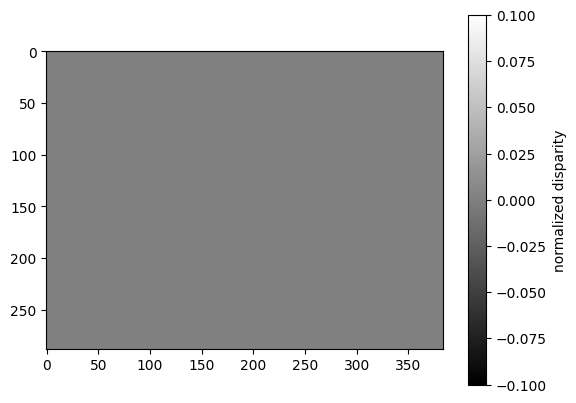

In [3]:
# Unormalised disparity 

disp16 = stereo.compute(imgL, imgR)           # CV_16S, scaled by 16
disp = disp16.astype(np.float32) / 16.0       # real disparity in pixels (float32)

# mask invalid (non-positive) disparities
disp[disp <= 0] = np.nan

# normalized image for display (0..255)
disp_vis = cv.normalize(disp, None, alpha=0, beta=255, norm_type=cv.NORM_MINMAX)
disp_vis = np.uint8(disp_vis)

plt.imshow(disp_vis, cmap='gray')
plt.colorbar(label='normalized disparity')
plt.show()


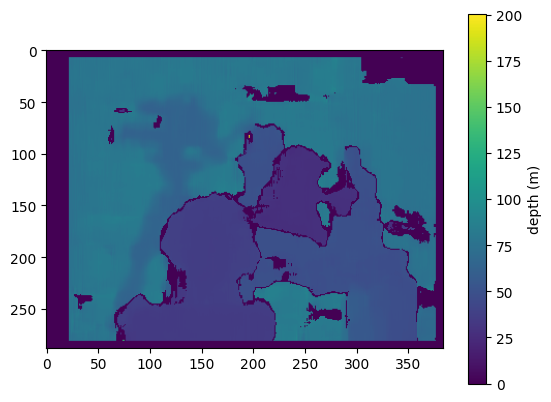

In [4]:
# Depth 

f = 718.856   # example focal length in pixels (from calibration)
B = 0.54      # baseline in meters
depth = f * B / (disp + 1e-6)     # avoid division by zero
depth[~np.isfinite(depth)] = 0
plt.imshow(depth, cmap='viridis')
plt.colorbar(label='depth (m)')
plt.show()


# KITTI Datatest

## Block Matching

### Testing

Image shape: (374, 1238) (374, 1238)


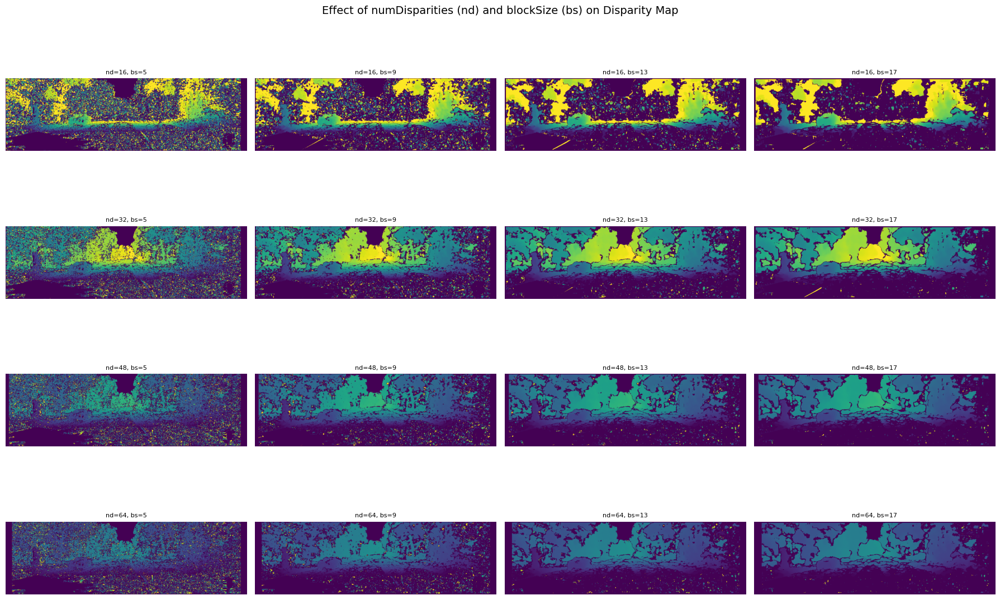

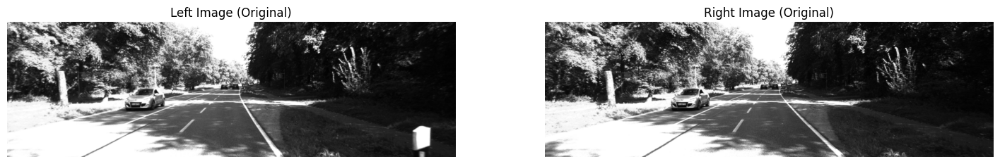

In [5]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import os

# ==============================
# 1. Load KITTI stereo image pair
# ==============================
left_path = "datasets/data_scene_flow/training/image_3/000157_10.png"
right_path = "datasets/data_scene_flow/training/image_2/000157_10.png"

imgL = cv.imread(left_path, cv.IMREAD_GRAYSCALE)
imgR = cv.imread(right_path, cv.IMREAD_GRAYSCALE)

if imgL is None or imgR is None:
    raise FileNotFoundError("Images not found. Check your paths!")

print("Image shape:", imgL.shape, imgR.shape)

# ==============================
# 2. Parameter ranges
# ==============================
num_disp_values = [16, 32, 48, 64]   # must be multiples of 16
block_size_values = [5, 9, 13, 17]      # must be odd and within valid range

# ==============================
# 3. Loop and compute disparities
# ==============================
plt.figure(figsize=(18, 12))
plot_index = 1

for nd in num_disp_values:
    for bs in block_size_values:
        # Create StereoBM with given parameters
        stereo = cv.StereoBM_create(numDisparities=nd, blockSize=bs)
        stereo.setMinDisparity(-32)
        # stereo.setPreFilterSize(9)
        # stereo.setPreFilterCap(31)
        # stereo.setTextureThreshold(10)
        # stereo.setUniquenessRatio(15)
        # stereo.setSpeckleWindowSize(50)
        # stereo.setSpeckleRange(16)

        
        # Compute disparity
        disparity = stereo.compute(imgL, imgR).astype(np.float32) / 16.0
        
        # Plot disparity
        plt.subplot(len(num_disp_values), len(block_size_values), plot_index)
        plt.imshow(disparity, cmap='viridis')
        plt.axis('off')
        plt.title(f'nd={nd}, bs={bs}', fontsize=8)
        plot_index += 1

plt.suptitle("Effect of numDisparities (nd) and blockSize (bs) on Disparity Map", fontsize=14)
plt.tight_layout()
plt.show()


# =====================================
# 4. Show original left image, disparity, and depth together
# =====================================
plt.figure(figsize=(18,6))

plt.subplot(1,2,1)
plt.imshow(imgL, cmap='gray')
plt.title("Left Image (Original)")
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(imgR, cmap='gray')
plt.title("Right Image (Original)")
plt.axis('off')

plt.show()


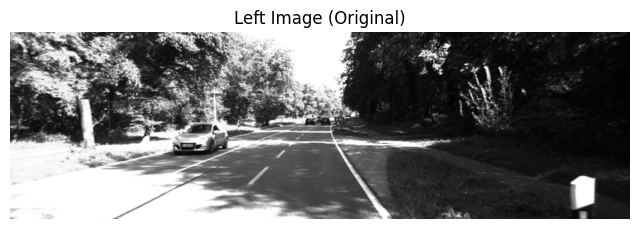

interactive(children=(IntSlider(value=10, description='thresh', max=50), IntSlider(value=15, description='uniq…

<function __main__.update(thresh=10, uniq=15, speckleW=24, speckleR=16, pfSize=9, pfCap=31, minD=-32, numD=32, bSize=11)>

In [6]:
import cv2 as cv
import matplotlib.pyplot as plt
from ipywidgets import interact

def update(thresh=10, uniq=15, speckleW=24, speckleR=16, pfSize=9, pfCap=31, minD= -32, numD = 32, bSize = 11):
    stereo = cv.StereoBM.create(numDisparities=numD, blockSize=bSize)
    # stereo.setROI1(8*5*5)
    # stereo.setROI2(32*5*5)
    stereo.setMinDisparity(minD)
    stereo.setTextureThreshold(thresh)
    stereo.setUniquenessRatio(uniq)
    stereo.setSpeckleWindowSize(speckleW)
    stereo.setSpeckleRange(speckleR)
    stereo.setPreFilterSize(pfSize)
    stereo.setPreFilterCap(pfCap)
    disp = stereo.compute(imgL, imgR).astype(float)/16.0
    #disp = cv.normalize(disp, None, 0, 255, cv.NORM_MINMAX, cv.CV_8U)
    plt.figure(figsize=(10,3))
    plt.imshow(disp, cmap='viridis')
    plt.colorbar()
    plt.show()

plt.figure(figsize=(8,6))
plt.imshow(imgL, cmap='gray')
plt.title("Left Image (Original)")
plt.axis('off')

interact(update, thresh=(0,50,1), uniq=(0,30,2), speckleW=(0,200,2), speckleR=(0,600,5), pfSize=(5,21,2), pfCap=(1,63,1), minD=(-256,256,16), 
          numD=(16,256,16), bSize=(5,31,2))


### Final Results

Image shape: (374, 1238) (374, 1238)


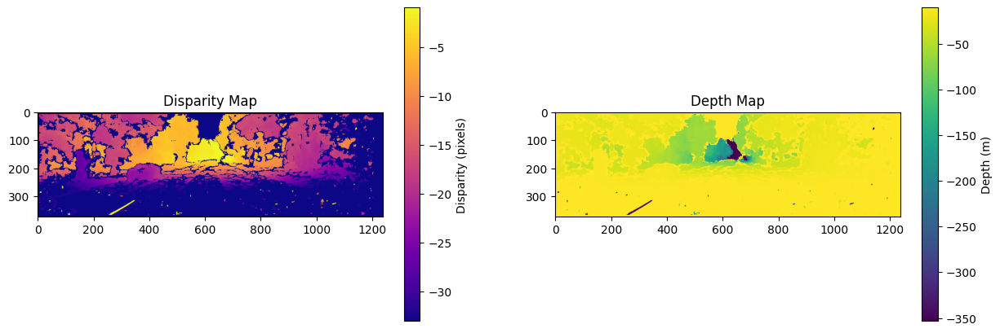

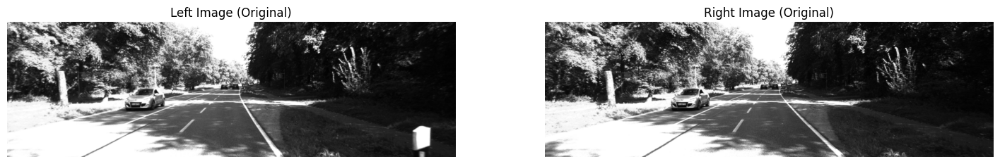

In [7]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import os

# ================================
# 1. Load KITTI stereo image pair
# ================================
# left: 000000_10.png, right: 000000_11.png
left_path = "datasets/data_scene_flow/training/image_3/000157_10.png"
right_path = "datasets/data_scene_flow/training/image_2/000157_10.png"

imgL = cv.imread(left_path, cv.IMREAD_GRAYSCALE)
imgR = cv.imread(right_path, cv.IMREAD_GRAYSCALE)

if imgL is None or imgR is None:
    raise FileNotFoundError("Images not found. Check your paths!")

print("Image shape:", imgL.shape, imgR.shape)

# =====================================
# 2. Stereo matcher 
# =====================================
window_size = 13   # blockSize : Must be odd, between 5 and 255, and not larger than image width/height.
num_disp = 32  # numDisparities : Must be > 0 and multiple of 16 (OpenCV requirement).

stereo = cv.StereoBM.create(numDisparities=num_disp, blockSize= window_size)
stereo.setMinDisparity(-32)
stereo.setTextureThreshold(0)
stereo.setUniquenessRatio(20)
stereo.setSpeckleWindowSize(9)
stereo.setSpeckleRange(50)
stereo.setPreFilterSize(9)
stereo.setPreFilterCap(31)

# =====================================
# 3. Compute disparity
# =====================================
disp = stereo.compute(imgL, imgR).astype(np.float32) / 16.0  # divide by 16 to get real disparities

# =====================================
# 4. Convert disparity -> depth (Z)
# =====================================
# KITTI calibration: 
f = 707.0     # focal length in pixels
B = 0.5   # baseline in meters
depth = f * B / (disp + 1e-6)   # avoid division by zero

# =====================================
# 5. Display results
# =====================================
plt.figure(figsize=(15,5))

plt.subplot(1,2,1)
plt.imshow(disp, cmap='plasma')
plt.colorbar(label="Disparity (pixels)")
plt.title("Disparity Map")

plt.subplot(1,2,2)
plt.imshow(depth, cmap='viridis')
plt.colorbar(label="Depth (m)")
plt.title("Depth Map")

plt.show()

# =====================================
# 6. Show original left image, disparity, and depth together
# =====================================
plt.figure(figsize=(18,6))

plt.subplot(1,2,1)
plt.imshow(imgL, cmap='gray')
plt.title("Left Image (Original)")
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(imgR, cmap='gray')
plt.title("Right Image (Original)")
plt.axis('off')

plt.show()



## For Slides

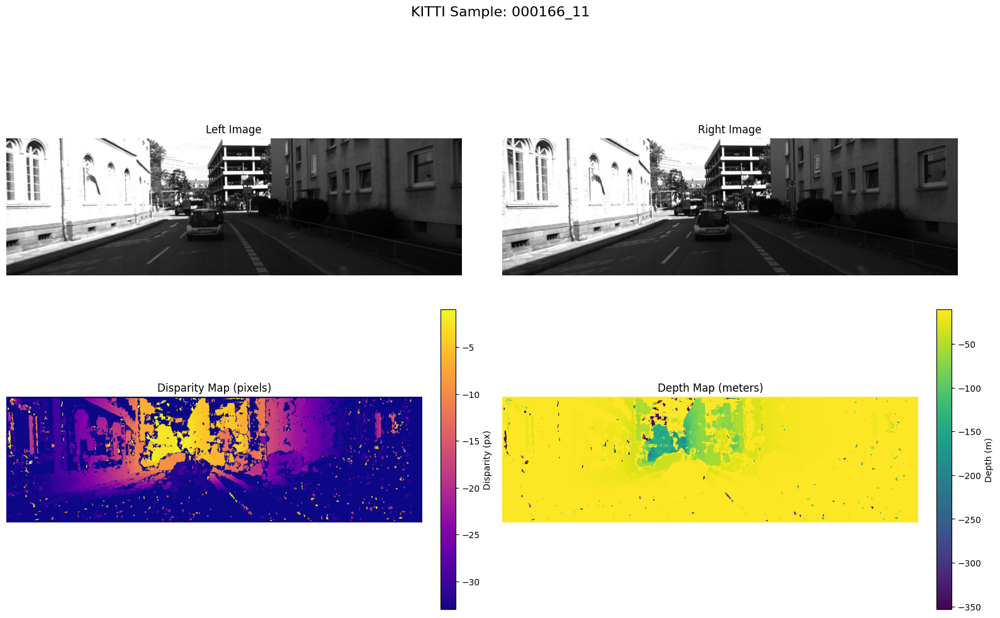

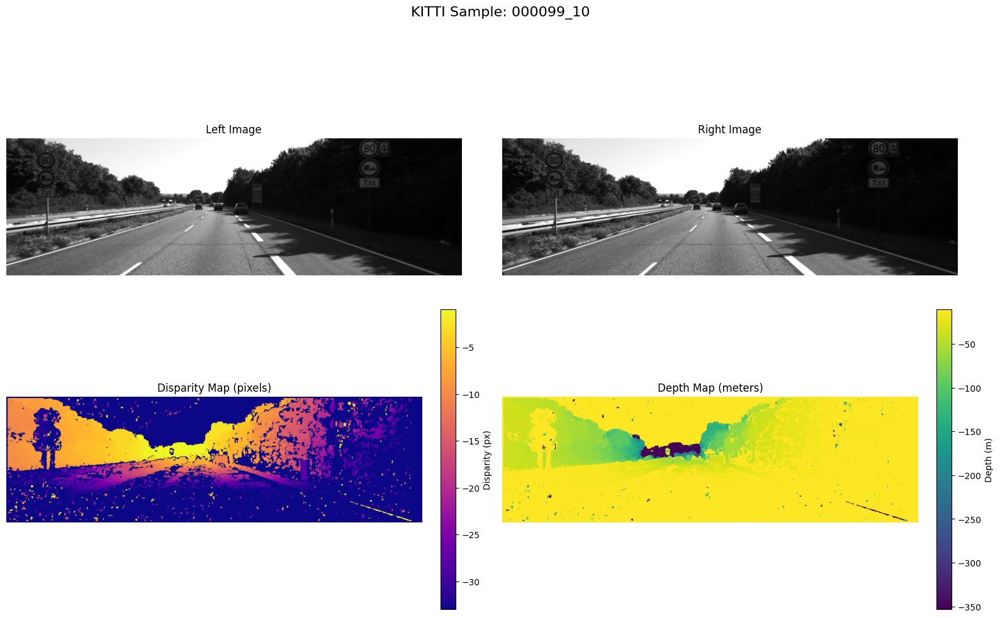

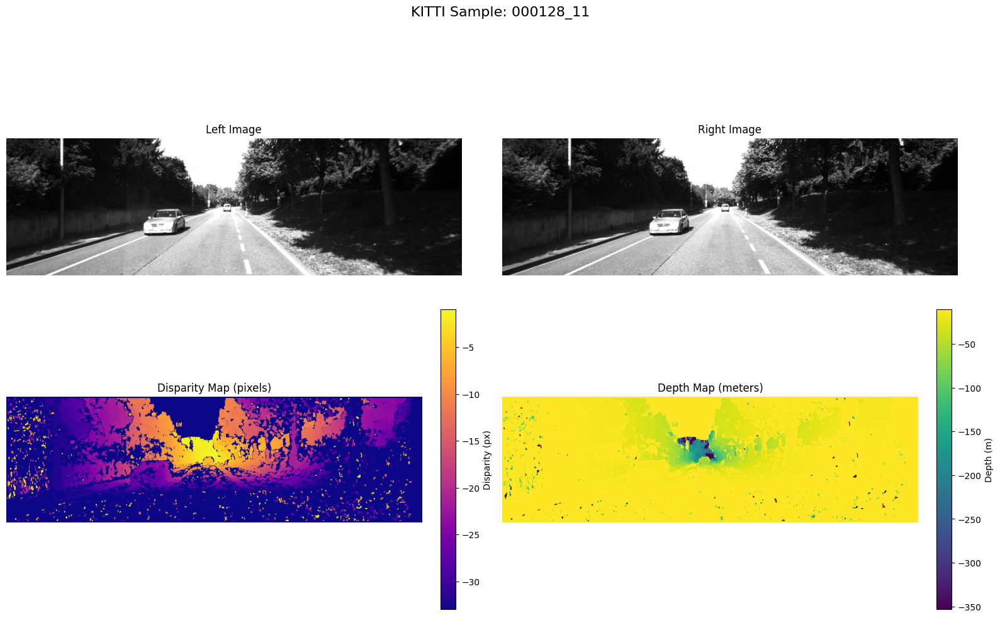

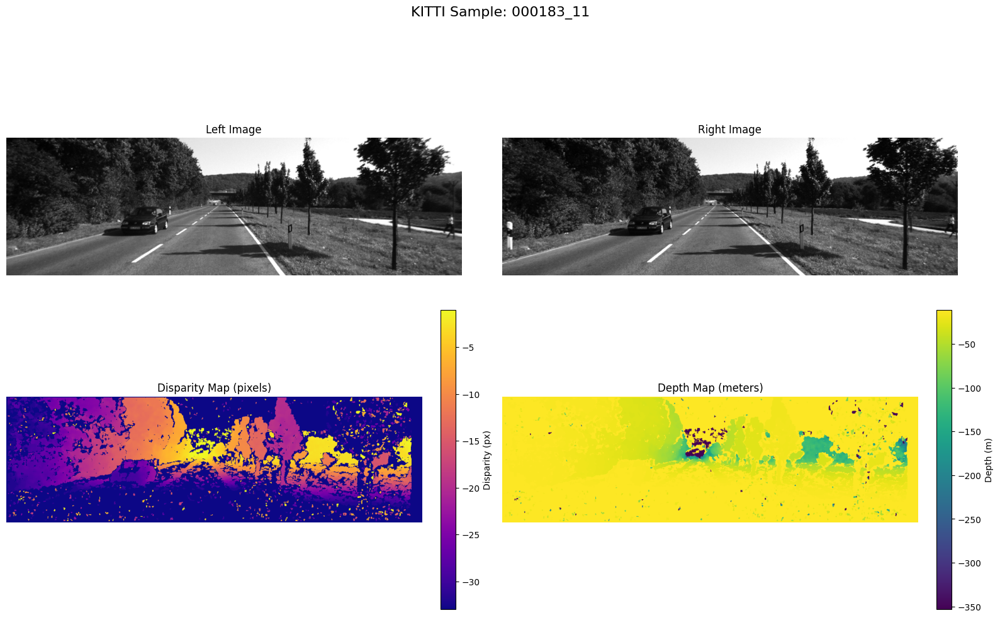

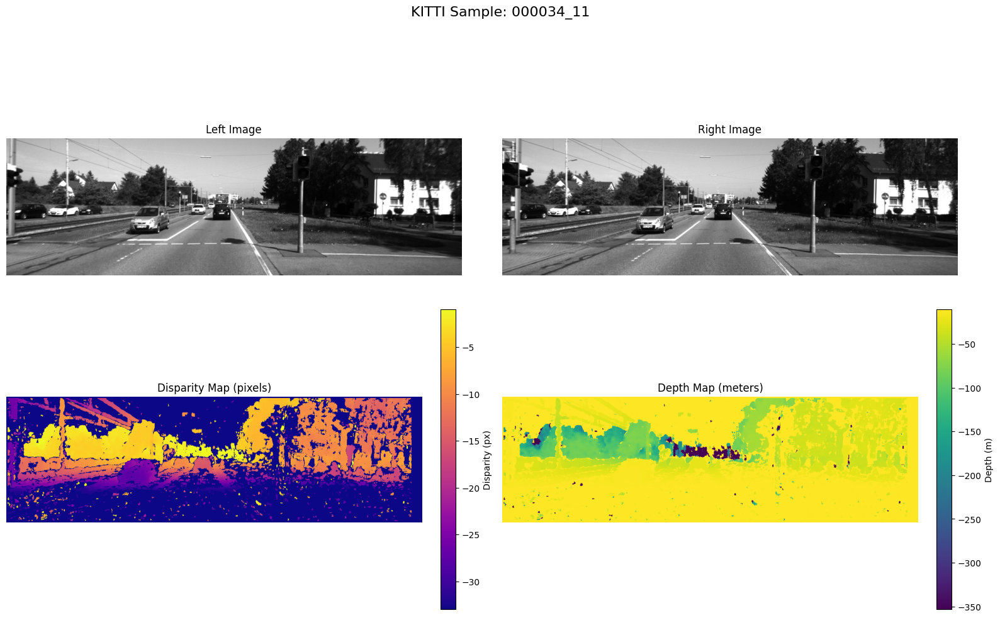

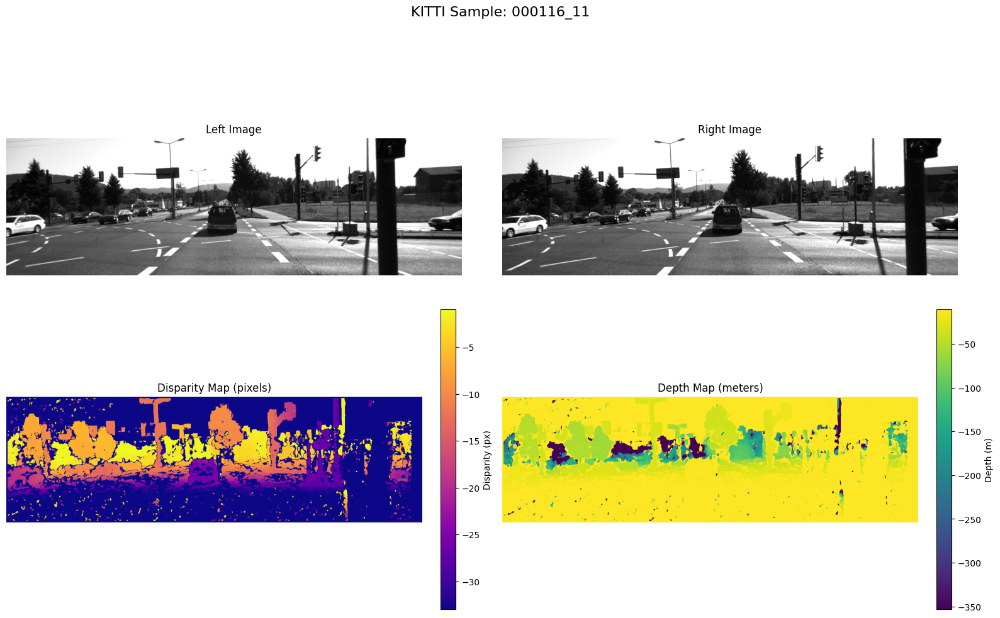

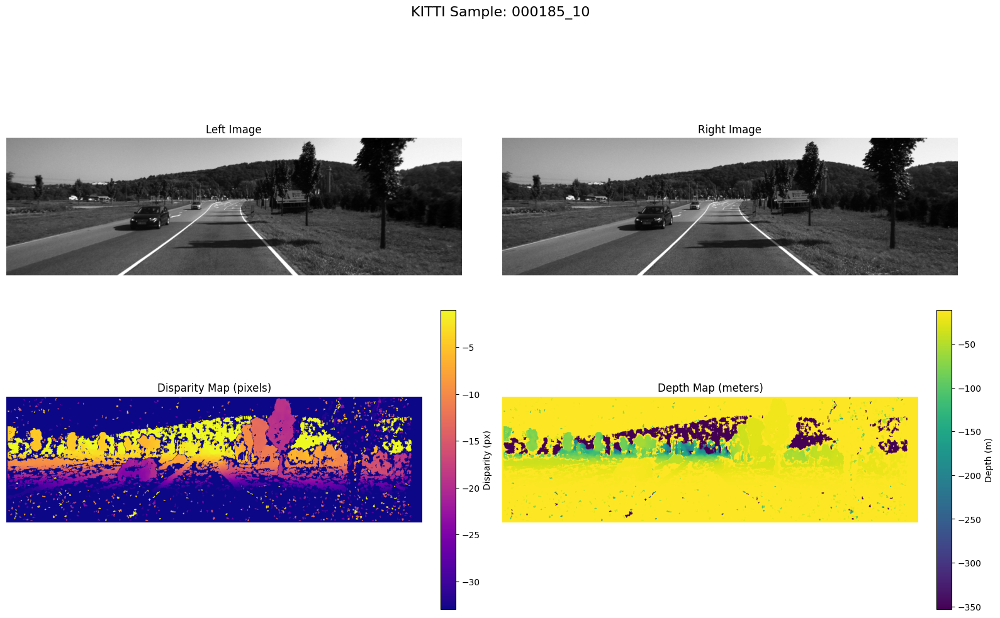

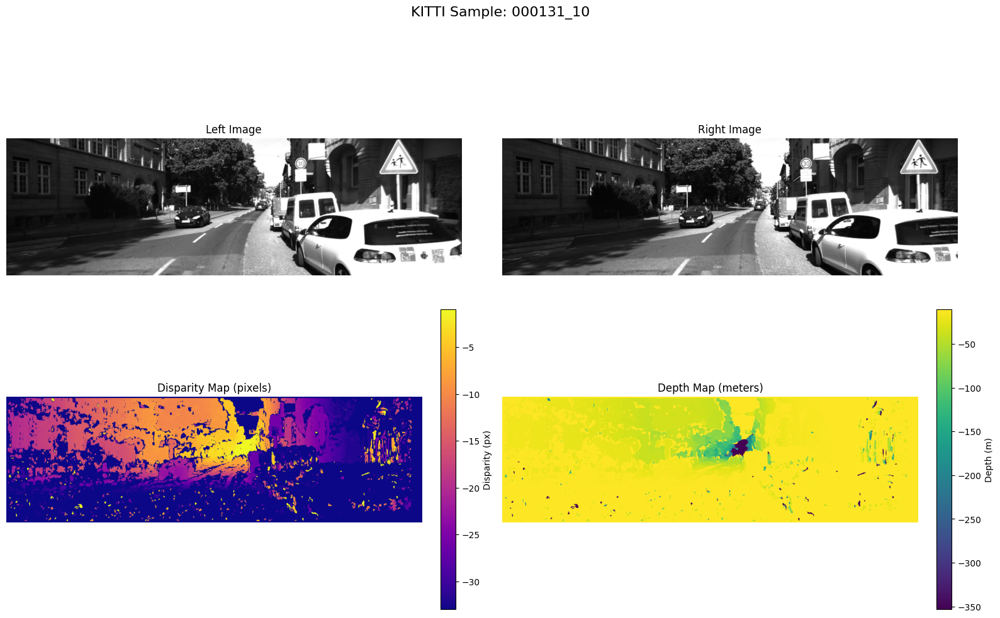

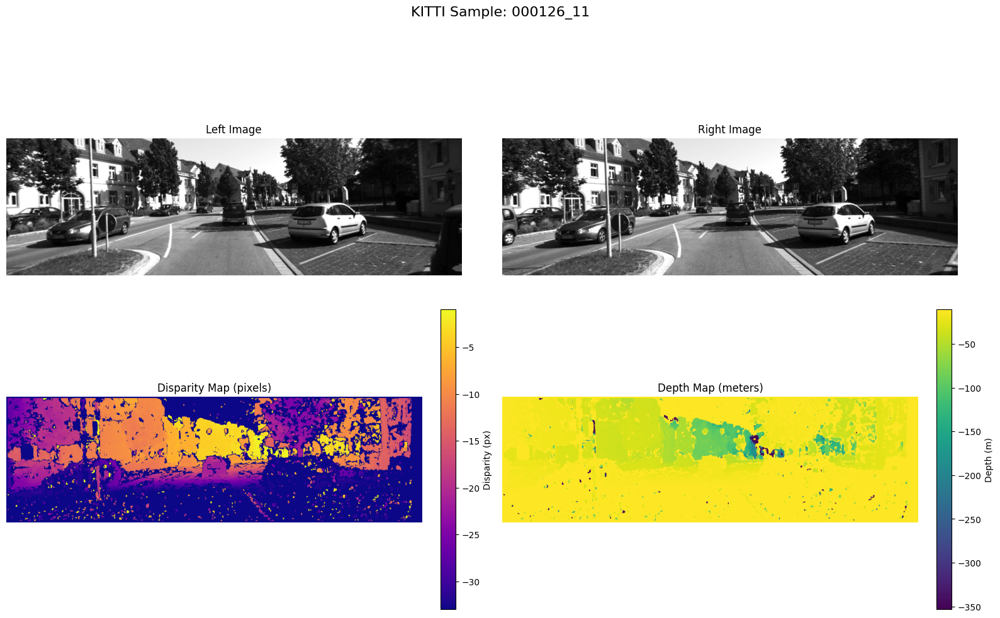

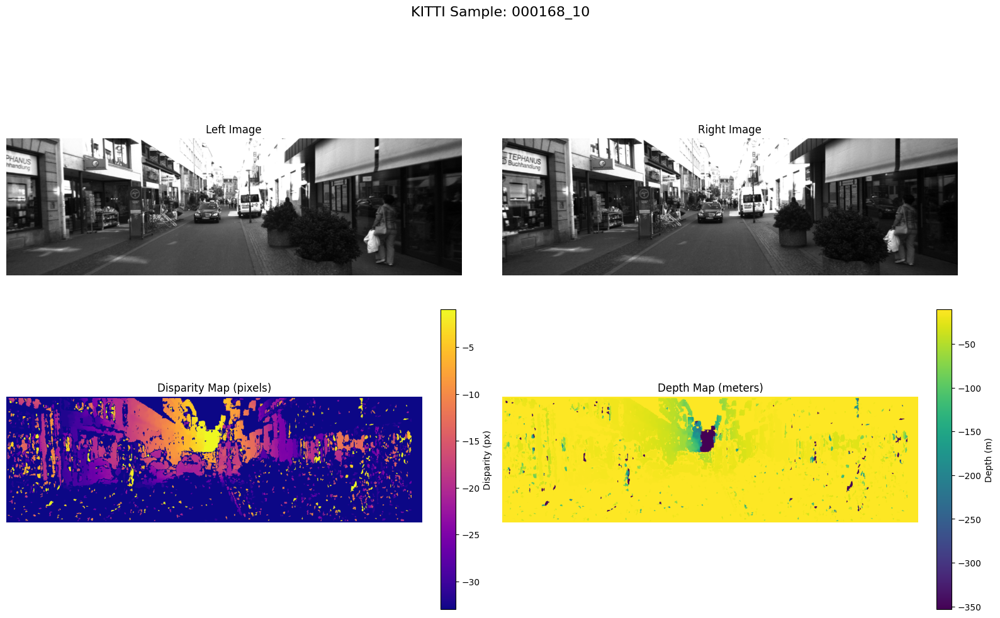

Presentation slides saved in 'slides_depthmap_classical'


In [ ]:
# ==============================
# Block Matching KITTI Presentation
# ==============================
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import os
from glob import glob
from pathlib import Path
import random

# ------------------------------
# 1. Paths and Parameters
# ------------------------------
left_dir = "datasets/data_scene_flow/training/image_3"   # left images folder
right_dir = "datasets/data_scene_flow/training/image_2"  # right images folder
out_dir = "slides_depthmap_classical"
os.makedirs(out_dir, exist_ok=True)

# Block matching parameters 
window_size = 9   # blockSize
num_disp = 32      # must be multiple of 16
min_disp = -32
texture_threshold = 1
uniqueness_ratio = 20
speckle_window = 9
speckle_range = 50
pre_filter_size = 9
pre_filter_cap = 50

# KITTI calibration
f = 707.0     # focal length in pixels
B = 0.5       # baseline in meters

# ------------------------------
# 2. Get random 10 images
# ------------------------------
left_images = sorted(glob(os.path.join(left_dir, "*.png")))
right_images = sorted(glob(os.path.join(right_dir, "*.png")))

if len(left_images) != len(right_images):
    raise ValueError("Left and right folder image counts do not match!")

# select 10 random indices
num_samples = min(10, len(left_images))
indices = random.sample(range(len(left_images)), num_samples)

# ------------------------------
# 3. Create StereoBM matcher
# ------------------------------
stereo = cv.StereoBM_create(numDisparities=num_disp, blockSize=window_size)
stereo.setMinDisparity(min_disp)
stereo.setTextureThreshold(texture_threshold)
stereo.setUniquenessRatio(uniqueness_ratio)
stereo.setSpeckleWindowSize(speckle_window)
stereo.setSpeckleRange(speckle_range)
stereo.setPreFilterSize(pre_filter_size)
stereo.setPreFilterCap(pre_filter_cap)

# ------------------------------
# 4. Loop over selected images
# ------------------------------
for idx in indices:
    left_path = left_images[idx]
    right_path = right_images[idx]
    basename = Path(left_path).stem
    
    # Load grayscale images
    imgL = cv.imread(left_path, cv.IMREAD_GRAYSCALE)
    imgR = cv.imread(right_path, cv.IMREAD_GRAYSCALE)
    
    if imgL is None or imgR is None:
        print(f"Skipping {basename}, image not found.")
        continue
    
    # Compute disparity
    disp = stereo.compute(imgL, imgR).astype(np.float32) / 16.0
    #disp[disp <= 0] = np.nan  # mask invalid
    
    # Compute depth
    depth = f * B / (disp + 1e-6)
    
    # ------------------------------
    # Presentation-style plotting
    # ------------------------------
    fig, axes = plt.subplots(2,2, figsize=(16,10))
    
    # Left image
    ax = axes[0,0]
    ax.imshow(imgL, cmap='gray')
    ax.set_title("Left Image")
    ax.axis('off')
    
    # Right image
    ax = axes[0,1]
    ax.imshow(imgR, cmap='gray')
    ax.set_title("Right Image")
    ax.axis('off')
    
    # Disparity map
    ax = axes[1,0]
    im = ax.imshow(disp, cmap='plasma')
    ax.set_title("Disparity Map (pixels)")
    ax.axis('off')
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label='Disparity (px)')
    
    # Depth map
    ax = axes[1,1]
    im = ax.imshow(depth, cmap='viridis')
    ax.set_title("Depth Map (meters)")
    ax.axis('off')
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label='Depth (m)')
    
    plt.suptitle(f"KITTI Sample: {basename}", fontsize=16)
    plt.tight_layout(rect=[0,0,1,0.95])
    
    # Save slide
    out_path = os.path.join(out_dir, f"{basename}_slide.png")
    fig.savefig(out_path, dpi=300)
    plt.show()
    plt.close()
    
print(f"Presentation slides saved in '{out_dir}'")


# Semi Global Block Matching

### Testing

Image shape: (374, 1238) (374, 1238)


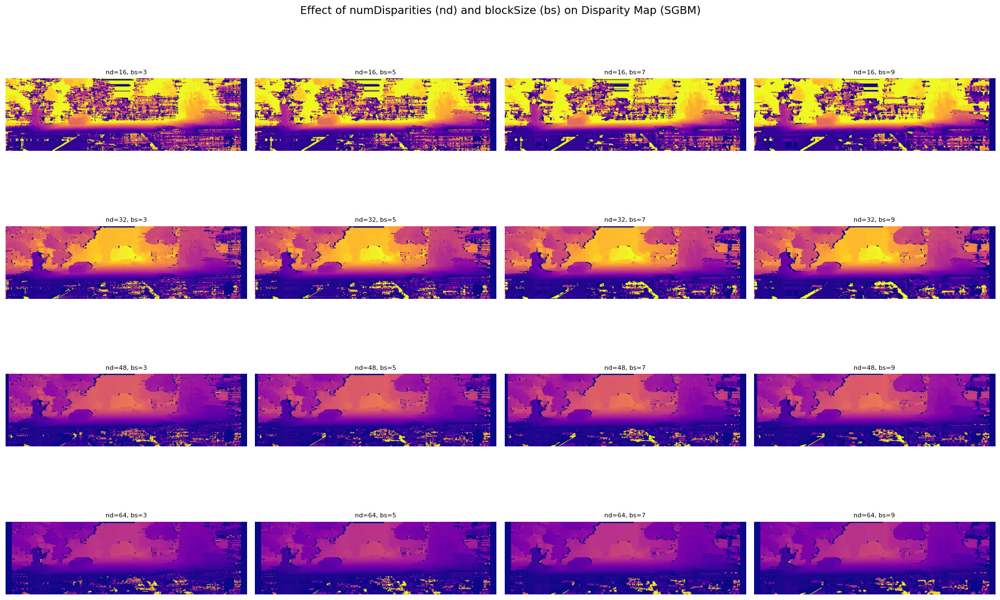

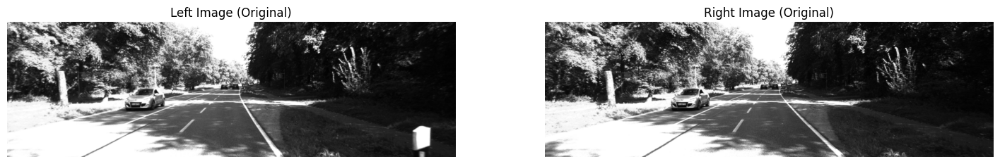

In [44]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import os

# ==============================
# 1. Load KITTI stereo image pair
# ==============================
left_path = "datasets/data_scene_flow/training/image_3/000157_10.png"
right_path = "datasets/data_scene_flow/training/image_2/000157_10.png"

imgL = cv.imread(left_path, cv.IMREAD_GRAYSCALE)
imgR = cv.imread(right_path, cv.IMREAD_GRAYSCALE)

if imgL is None or imgR is None:
    raise FileNotFoundError("Images not found. Check your paths!")

print("Image shape:", imgL.shape, imgR.shape)

# ==============================
# 2. Parameter ranges
# ==============================
num_disp_values = [16, 32, 48, 64]  # Must be multiples of 16
block_size_values = [3, 5, 7, 9]    # Must be odd

# ==============================
# 3. Loop and compute disparities (SGBM)
# ==============================
plt.figure(figsize=(18, 12))
plot_index = 1

for nd in num_disp_values:
    for bs in block_size_values:
        # Compute penalty parameters based on block size
        P1 = 8 * 3 * bs ** 2     # Smoothness penalty for small disparity changes
        P2 = 32 * 3 * bs ** 2    # Penalty for larger disparity changes

        stereo = cv.StereoSGBM_create(
            minDisparity=-32,
            numDisparities=nd,
            blockSize=bs,
            P1=P1,
            P2=P2,
            disp12MaxDiff=1,
            uniquenessRatio=10,
            speckleWindowSize=100,
            speckleRange=32,
            preFilterCap=63,
            mode=cv.STEREO_SGBM_MODE_SGBM_3WAY
        )

        # Compute disparity
        disparity = stereo.compute(imgL, imgR).astype(np.float32) / 16.0

        # Plot disparity
        plt.subplot(len(num_disp_values), len(block_size_values), plot_index)
        plt.imshow(disparity, cmap='plasma')
        plt.axis('off')
        plt.title(f'nd={nd}, bs={bs}', fontsize=8)
        plot_index += 1

plt.suptitle("Effect of numDisparities (nd) and blockSize (bs) on Disparity Map (SGBM)", fontsize=14)
plt.tight_layout()
plt.show()

# ==============================
# 4. Show original images
# ==============================
plt.figure(figsize=(18, 6))
plt.subplot(1, 2, 1)
plt.imshow(imgL, cmap='gray')
plt.title("Left Image (Original)")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(imgR, cmap='gray')
plt.title("Right Image (Original)")
plt.axis('off')

plt.show()


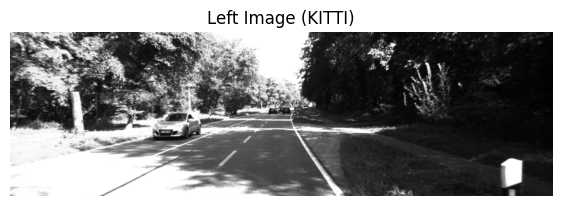

interactive(children=(IntSlider(value=5, description='blockSize', max=15, min=5, step=2), IntSlider(value=128,…

<function __main__.update(blockSize=5, numDisp=128, minDisp=0, uniquenessRatio=10, speckleWindowSize=100, speckleRange=32, disp12MaxDiff=1, preFilterCap=63, P1_mult=8, P2_mult=32, mode=1)>

In [47]:
import cv2 as cv
import matplotlib.pyplot as plt
from ipywidgets import interact, fixed
import numpy as np

# ============================================
# Load KITTI stereo image pair
# ============================================
left_path = "datasets/data_scene_flow/training/image_3/000157_10.png"
right_path = "datasets/data_scene_flow/training/image_2/000157_10.png"

imgL = cv.imread(left_path, cv.IMREAD_GRAYSCALE)
imgR = cv.imread(right_path, cv.IMREAD_GRAYSCALE)

if imgL is None or imgR is None:
    raise FileNotFoundError("Images not found! Check your paths.")

plt.figure(figsize=(7,5))
plt.imshow(imgL, cmap='gray')
plt.title("Left Image (KITTI)")
plt.axis('off')
plt.show()


# ============================================
# Interactive update function for StereoSGBM
# ============================================
def update(
    blockSize=5,          # size of matching window
    numDisp=128,          # disparity range (must be multiple of 16)
    minDisp=0,            # minimum possible disparity
    uniquenessRatio=10,   # rejects ambiguous matches
    speckleWindowSize=100,
    speckleRange=32,
    disp12MaxDiff=1,
    preFilterCap=63,
    P1_mult=8,            # smoothness penalty P1 multiplier
    P2_mult=32,           # smoothness penalty P2 multiplier
    mode=1                # 0=SGBM, 1=SGBM_3WAY
):
    # Ensure numDisp is a multiple of 16
    numDisp = int(numDisp // 16 * 16)
    
    # Create StereoSGBM object
    stereo = cv.StereoSGBM_create(
        minDisparity=minDisp,
        numDisparities=numDisp,
        blockSize=blockSize,
        P1=P1_mult * blockSize ** 2,
        P2=P2_mult * blockSize ** 2,
        disp12MaxDiff=disp12MaxDiff,
        uniquenessRatio=uniquenessRatio,
        speckleWindowSize=speckleWindowSize,
        speckleRange=speckleRange,
        preFilterCap=preFilterCap,
        mode=cv.STEREO_SGBM_MODE_SGBM if mode == 0 else cv.STEREO_SGBM_MODE_SGBM_3WAY
    )

    # Compute disparity
    disp = stereo.compute(imgL, imgR).astype(np.float32) / 16.0

    # Mask invalid disparity values
    #disp[disp <= 0] = np.nan

    # Plot result
    plt.figure(figsize=(12,4))
    plt.imshow(disp, cmap='plasma')
    plt.colorbar(label="Disparity (pixels)")
    plt.title("StereoSGBM Disparity Map")
    plt.axis('off')
    plt.show()


# ============================================
# Interactive UI
# ============================================
interact(
    update,
    blockSize=(5,15,2),
    numDisp=(16,256,16),
    minDisp=(-64,64,8),
    uniquenessRatio=(0,20,1),
    speckleWindowSize=(0,200,5),
    speckleRange=(0,64,4),
    disp12MaxDiff=(0,5,1),
    preFilterCap=(1,63,2),
    P1_mult=(4,12,2),
    P2_mult=(16,64,4),
    mode={'SGBM':0, 'SGBM_3WAY':1}
)


### Final Results

Image shape: (374, 1238) (374, 1238)


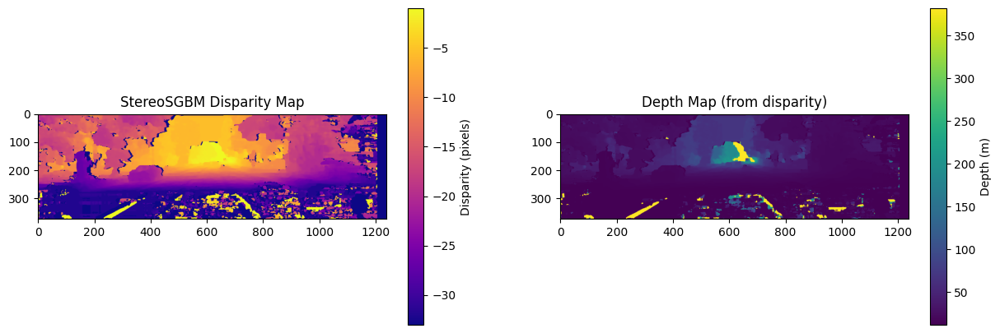

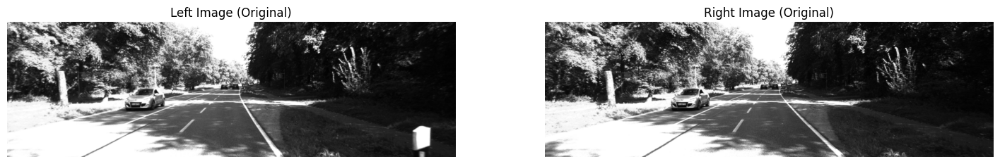

In [43]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import os

# ================================================
# 1️⃣ Load KITTI stereo image pair
# ================================================
left_path = "datasets/data_scene_flow/training/image_3/000157_10.png"
right_path = "datasets/data_scene_flow/training/image_2/000157_10.png"

imgL = cv.imread(left_path, cv.IMREAD_GRAYSCALE)
imgR = cv.imread(right_path, cv.IMREAD_GRAYSCALE)

if imgL is None or imgR is None:
    raise FileNotFoundError("Images not found. Check your paths!")

print("Image shape:", imgL.shape, imgR.shape)

# ================================================
# 2️⃣ Create StereoSGBM matcher
# ================================================
# The parameters here are more tunable and give better accuracy
window_size = 9   # blockSize
num_disp = 32      # must be multiple of 16
min_disp = -32

stereo = cv.StereoSGBM_create(
    minDisparity=min_disp,
    numDisparities=num_disp,
    blockSize=window_size,
    P1=8 * 1 * window_size ** 2,    # Penalty for small disparity changes
    P2=32 * 1 * window_size ** 2,   # Penalty for large disparity changes
    disp12MaxDiff=1,                # Left-right disparity check
    uniquenessRatio=10,             # Enforces unique matches
    speckleWindowSize=100,          # Removes small false regions
    speckleRange=32,                # Maximum allowed disparity variation
    preFilterCap=63,                # Intensity normalization
    mode=cv.STEREO_SGBM_MODE_SGBM_3WAY  # Better quality, slower
)

# ================================================
# 3️⃣ Compute disparity map
# ================================================
disp = stereo.compute(imgL, imgR).astype(np.float32) / 16.0

# ================================================
# 4️⃣ Convert disparity to depth (Z)
# ================================================
f = 707.0   # focal length (KITTI calib)
B = 0.54    # baseline (KITTI)
depth = f * B / (disp + 1e-6)   # avoid div by zero

# Mask invalid values (disparity <= 0)
depth[disp <= 0] = np.abs(depth[disp <= 0])

# ================================================
# 5️⃣ Plot disparity and depth maps
# ================================================
plt.figure(figsize=(15,5))

plt.subplot(1,2,1)
plt.imshow(disp, cmap='plasma')
plt.colorbar(label="Disparity (pixels)")
plt.title("StereoSGBM Disparity Map")

plt.subplot(1,2,2)
plt.imshow(depth, cmap='viridis')
plt.colorbar(label="Depth (m)")
plt.title("Depth Map (from disparity)")

plt.show()

# ================================================
# 6️⃣ Show the original left & right images
# ================================================
plt.figure(figsize=(18,6))

plt.subplot(1,2,1)
plt.imshow(imgL, cmap='gray')
plt.title("Left Image (Original)")
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(imgR, cmap='gray')
plt.title("Right Image (Original)")
plt.axis('off')

plt.show()
